<a href="https://colab.research.google.com/github/lmencisoe/CDA/blob/main/Parcial1/Parcial1_lm_enciso.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Parcial 1

MINE-4101: Applied Data Science  
Univerisdad de los Andes  

## **Luis Miguel Enciso**

In [1]:
!pip install --upgrade pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 268 kB 15.5 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 690 kB 53.6 MB/s 
     |████████████████████████████████| 9.8 MB 64.1 MB/s 
     |████████████████████████████████| 4.7 MB 55.7 MB/s 
     |████████████████████████████████| 102 kB 75.6 MB/s 
     |████████████████████████████████| 296 kB 55.0 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=e9bcdb08f3f8ca154e64ce270712b1a345bdbeda3e7b8fe434ab0f44d5ca4f4b
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
Successfully built htmlmin
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
  Attempting uninstall: requests
  

In [17]:
# Importing required libraries

import re
from random import randint
from datetime import datetime
from pandas_profiling import ProfileReport
import matplotlib
from sklearn.metrics import r2_score

from matplotlib import pyplot as plt

import statistics
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
import numpy as np
import pandas as pd
import sklearn

from sklearn.preprocessing import StandardScaler
import pylev

In [3]:
# Parameter for showing all columns when printing a dataframe
pd.set_option('display.max_columns', None)

# **Leemos la data inicial y removemos duplicados**
**PRIMER PUNTO**

In [4]:
# Loading data
data_alpes = pd.read_csv("https://raw.githubusercontent.com/lmencisoe/CDA/main/Parcial1/losalpes_history.csv")
data_alpes = data_alpes.drop_duplicates()

In [5]:
# Printing the dataset dimensions
data_alpes.shape

(101547, 16)

In [6]:
# Printing column data types
data_alpes.dtypes

id                       int64
neighbourhood group     object
neighbourhood           object
lat                    float64
long                   float64
country                 object
instant_bookable        object
cancellation_policy     object
room type               object
construction year      float64
price                   object
service fee             object
minimum nights         float64
availability 365       float64
number of reviews      float64
review rate number     float64
dtype: object

In [7]:
data_alpes.head(5)

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number
0,48540006,Manhattan,Hell's Kitchen,40.76212,-73.98820,United States,True,strict,Entire home/apt,2011.0,$ 851,$ 170,4.0,199.0,112.0,1.0
1,35079903,Manhattan,Midtown,40.74623,-73.98499,United States,True,flexible,Hotel room,2021.0,$ 466,$ 93,1.0,161.0,13.0,5.0
2,50681273,Manhattan,Upper West Side,40.78859,-73.97568,United States,False,flexible,Private room,2004.0,$ 874,$ 175,14.0,0.0,1.0,2.0
3,13039267,Manhattan,Financial District,40.70817,-74.00511,United States,False,strict,Private room,2012.0,$ 813,$ 163,1.0,0.0,5.0,3.0
4,8998640,Manhattan,Lower East Side,40.72130,-73.98900,United States,True,moderate,Entire home/apt,2007.0,$ 326,$ 65,4.0,301.0,9.0,3.0


In [8]:
duplicates_by_id = data_alpes.loc[data_alpes["id"].duplicated(keep = False)]
duplicates_by_id

,id,neighbourhood group,neighbourhood,lat,long,country,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number


**No hay duplicados de inmuebles**

# **Cambio a numérica de las variables de precio removiendo los signos de $**

In [9]:
data_alpes['price'] = data_alpes['price'].replace('[\$,]', '', regex=True).astype(float)
data_alpes['service fee'] = data_alpes['service fee'].replace('[\$,]', '', regex=True).astype(float)

In [10]:
data_alpes.dtypes

id                       int64
neighbourhood group     object
neighbourhood           object
lat                    float64
long                   float64
country                 object
instant_bookable        object
cancellation_policy     object
room type               object
construction year      float64
price                  float64
service fee            float64
minimum nights         float64
availability 365       float64
number of reviews      float64
review rate number     float64
dtype: object

# **Profile report de la data actual**

In [11]:
data_alpes.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Removemos la primera columna de ID que no brinda información  y la de país, porque todos son de USA**

In [167]:
data_alpes2 = data_alpes.copy()
data_alpes2 = data_alpes2.drop(columns=['id', 'country'])

**Contamos cantidad de na's or fila**

In [168]:
data_alpes2['nas'] = data_alpes2.isnull().sum(axis=1)
data_alpes2["nas"].value_counts()


0     98990
1      1688
14      585
2       242
3        39
4         3
Name: nas, dtype: int64

**Removemos las filas que tienen 10 nas**, (en casi todas las columnas)

In [169]:
data_alpes2 = data_alpes2[data_alpes2['nas'] < 10]
data_alpes2

,neighbourhood group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number,nas
0,Manhattan,Hell's Kitchen,40.76212,-73.98820,True,strict,Entire home/apt,2011.0,851.0,170.0,4.0,199.0,112.0,1.0,0
1,Manhattan,Midtown,40.74623,-73.98499,True,flexible,Hotel room,2021.0,466.0,93.0,1.0,161.0,13.0,5.0,0
2,Manhattan,Upper West Side,40.78859,-73.97568,False,flexible,Private room,2004.0,874.0,175.0,14.0,0.0,1.0,2.0,0
3,Manhattan,Financial District,40.70817,-74.00511,False,strict,Private room,2012.0,813.0,163.0,1.0,0.0,5.0,3.0,0
4,Manhattan,Lower East Side,40.72130,-73.98900,True,moderate,Entire home/apt,2007.0,326.0,65.0,4.0,301.0,9.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,Prospect Heights,40.68137,-73.97081,False,flexible,Entire home/apt,2014.0,428.0,86.0,3.0,142.0,27.0,2.0,0
102079,Brooklyn,Williamsburg,40.70951,-73.96443,False,strict,Private room,2004.0,114.0,227.0,2.0,343.0,7.0,2.0,0
102080,Queens,Rosedale,40.67104,-73.73006,True,flexible,Private room,2018.0,98.0,20.0,2.0,355.0,12.0,1.0,0
102081,Manhattan,Upper West Side,40.78012,-73.98439,True,moderate,Entire home/apt,2007.0,316.0,63.0,1.0,302.0,0.0,NaN,1


In [170]:
data_alpes2["nas"].value_counts()

0    98990
1     1688
2      242
3       39
4        3
Name: nas, dtype: int64

**Reemplazamos valores menores a cero en price, service fee, minimum nights, availability, lat y long, además de los respectivos outliers y los vacíos por le mediana** (Es una medida robusta a datos atípicos)

In [171]:
median_price = statistics.median(data_alpes2['price'])
out_sup_price = data_alpes2['price'].mean(skipna=True) + 3*data_alpes2['price'].std(skipna=True)
median_service_fee = statistics.median(data_alpes2['service fee'])
out_sup_service_fee = data_alpes2['service fee'].mean(skipna=True) + 3*data_alpes2['service fee'].std(skipna=True)
median_minimum_n = statistics.median(data_alpes2['minimum nights'])
out_sup_minimum_n = data_alpes2['minimum nights'].mean(skipna=True) + 3*data_alpes2['minimum nights'].std(skipna=True)
median_ava365 = statistics.median(data_alpes2['availability 365'])
out_sup_ava365= data_alpes2['availability 365'].mean(skipna=True) + 3*data_alpes2['availability 365'].std(skipna=True)
median_lan = statistics.median(data_alpes2['lat'])
median_long = statistics.median(data_alpes2['long'])

In [172]:
data_alpes2['price'][pd.isna(data_alpes2['price'])] = median_price
data_alpes2['service fee'][pd.isna(data_alpes2['service fee'])] = median_service_fee
data_alpes2['minimum nights'][pd.isna(data_alpes2['minimum nights'])] = median_minimum_n
data_alpes2['availability 365'][pd.isna(data_alpes2['availability 365'])] = median_ava365
data_alpes2['lat'][pd.isna(data_alpes2['lat'])] = median_lan
data_alpes2['long'][pd.isna(data_alpes2['long'])] = median_long

**No modificamos de la misma forma la variable respuesta, por esto mismo (ser la variable respuesta)**

In [173]:
data_alpes2['price'][data_alpes2['price'] > out_sup_price] = median_price
data_alpes2['price'][data_alpes2['price'] <= 0] = median_price
data_alpes2['service fee'][data_alpes2['service fee'] > out_sup_service_fee] = median_service_fee
data_alpes2['service fee'][data_alpes2['service fee'] <= 0] = median_service_fee
data_alpes2['minimum nights'][data_alpes2['minimum nights'] > out_sup_minimum_n] = median_minimum_n
data_alpes2['minimum nights'][data_alpes2['minimum nights'] <= 0] = median_minimum_n
data_alpes2['availability 365'][data_alpes2['availability 365'] > 365] = 365
data_alpes2['availability 365'][data_alpes2['availability 365'] <= 0] = median_ava365
data_alpes2 = data_alpes2[data_alpes2['number of reviews'] >= 0]
data_alpes2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid 

,neighbourhood group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number,nas
0,Manhattan,Hell's Kitchen,40.76212,-73.98820,True,strict,Entire home/apt,2011.0,851.0,170.0,4.0,199.0,112.0,1.0,0
1,Manhattan,Midtown,40.74623,-73.98499,True,flexible,Hotel room,2021.0,466.0,93.0,1.0,161.0,13.0,5.0,0
2,Manhattan,Upper West Side,40.78859,-73.97568,False,flexible,Private room,2004.0,874.0,175.0,14.0,0.0,1.0,2.0,0
3,Manhattan,Financial District,40.70817,-74.00511,False,strict,Private room,2012.0,813.0,163.0,1.0,0.0,5.0,3.0,0
4,Manhattan,Lower East Side,40.72130,-73.98900,True,moderate,Entire home/apt,2007.0,326.0,65.0,4.0,301.0,9.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,Prospect Heights,40.68137,-73.97081,False,flexible,Entire home/apt,2014.0,428.0,86.0,3.0,142.0,27.0,2.0,0
102079,Brooklyn,Williamsburg,40.70951,-73.96443,False,strict,Private room,2004.0,114.0,227.0,2.0,343.0,7.0,2.0,0
102080,Queens,Rosedale,40.67104,-73.73006,True,flexible,Private room,2018.0,98.0,20.0,2.0,355.0,12.0,1.0,0
102081,Manhattan,Upper West Side,40.78012,-73.98439,True,moderate,Entire home/apt,2007.0,316.0,63.0,1.0,302.0,0.0,NaN,1


**Dejamos fecha del inmueble desde 2000 y removemos los outliers en la respuesta**

In [174]:
data_alpes2 = data_alpes2[data_alpes2['construction year'] > 2000]
out_sup_y= data_alpes2['number of reviews'].mean(skipna=True) + 3*data_alpes2['number of reviews'].std(skipna=True)
data_alpes2 = data_alpes2[data_alpes2['number of reviews'] < out_sup_y]
data_alpes2

,neighbourhood group,neighbourhood,lat,long,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,number of reviews,review rate number,nas
0,Manhattan,Hell's Kitchen,40.76212,-73.98820,True,strict,Entire home/apt,2011.0,851.0,170.0,4.0,199.0,112.0,1.0,0
1,Manhattan,Midtown,40.74623,-73.98499,True,flexible,Hotel room,2021.0,466.0,93.0,1.0,161.0,13.0,5.0,0
2,Manhattan,Upper West Side,40.78859,-73.97568,False,flexible,Private room,2004.0,874.0,175.0,14.0,0.0,1.0,2.0,0
3,Manhattan,Financial District,40.70817,-74.00511,False,strict,Private room,2012.0,813.0,163.0,1.0,0.0,5.0,3.0,0
4,Manhattan,Lower East Side,40.72130,-73.98900,True,moderate,Entire home/apt,2007.0,326.0,65.0,4.0,301.0,9.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,Prospect Heights,40.68137,-73.97081,False,flexible,Entire home/apt,2014.0,428.0,86.0,3.0,142.0,27.0,2.0,0
102079,Brooklyn,Williamsburg,40.70951,-73.96443,False,strict,Private room,2004.0,114.0,227.0,2.0,343.0,7.0,2.0,0
102080,Queens,Rosedale,40.67104,-73.73006,True,flexible,Private room,2018.0,98.0,20.0,2.0,355.0,12.0,1.0,0
102081,Manhattan,Upper West Side,40.78012,-73.98439,True,moderate,Entire home/apt,2007.0,316.0,63.0,1.0,302.0,0.0,NaN,1


**Para efectos prácticos del modelo vamos a eliminar la columna del Barrio por su alta dimensionalidad, y crear la columna de la antiguedad del inmueble (Tomando como punto final el año 2022)** \\
**También, vamos a eliminar la columna del review ya que nos interesa trabajar en la cantidad de reviews y en la data nueva no contamos con esta columna.** \\

In [175]:
data_alpes2['antiguedad'] = 2022 - data_alpes2['construction year']
data_alpes3 = data_alpes2.copy()
data_alpes3 = data_alpes2.drop(columns=['neighbourhood', 'nas', 'construction year','review rate number'])
data_alpes3

,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,number of reviews,antiguedad
0,Manhattan,40.76212,-73.98820,True,strict,Entire home/apt,851.0,170.0,4.0,199.0,112.0,11.0
1,Manhattan,40.74623,-73.98499,True,flexible,Hotel room,466.0,93.0,1.0,161.0,13.0,1.0
2,Manhattan,40.78859,-73.97568,False,flexible,Private room,874.0,175.0,14.0,0.0,1.0,18.0
3,Manhattan,40.70817,-74.00511,False,strict,Private room,813.0,163.0,1.0,0.0,5.0,10.0
4,Manhattan,40.72130,-73.98900,True,moderate,Entire home/apt,326.0,65.0,4.0,301.0,9.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,40.68137,-73.97081,False,flexible,Entire home/apt,428.0,86.0,3.0,142.0,27.0,8.0
102079,Brooklyn,40.70951,-73.96443,False,strict,Private room,114.0,227.0,2.0,343.0,7.0,18.0
102080,Queens,40.67104,-73.73006,True,flexible,Private room,98.0,20.0,2.0,355.0,12.0,4.0
102081,Manhattan,40.78012,-73.98439,True,moderate,Entire home/apt,316.0,63.0,1.0,302.0,0.0,15.0


**Ajustamoms la localidad, eliminando vacios y reemplazando valores mal escritos**

In [176]:
data_alpes3 = data_alpes3[data_alpes3['neighbourhood group'].notnull()]

In [177]:
 neighbourhood_list = ['Manhattan' , 'Brooklyn', 'Queens', 'Bronx', 'Staten Island']
 data_alpes3.loc[~data_alpes3["neighbourhood group"].isin(neighbourhood_list), "neighbourhood group"].unique()

array(['Quens', 'Manattan', 'Broolkyn', 'Manhatan', 'brookln'],
      dtype=object)

In [178]:
 data_alpes3["neighbourhood group"].replace({"Quens": "Queens", "Manattan": "Manhattan", "Broolkyn": "Brooklyn", "Manhatan": "Manhattan","brookln": "Brooklyn", }, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [179]:
 data_alpes3.loc[~data_alpes3["neighbourhood group"].isin(neighbourhood_list), "neighbourhood group"].unique()

array([], dtype=object)

**Removemos el dato faltante en la columna de reserva directamente por plataforma (<0.7%) y en la variable respuesta**

In [180]:
data_alpes4 = data_alpes3.copy()
data_alpes4 = data_alpes3[~pd.isnull(data_alpes3['instant_bookable'])]
data_alpes4 = data_alpes4[~pd.isnull(data_alpes4['number of reviews'])]

# **Creamos un nuevo profile report para la data limpia**

In [72]:
data_alpes4.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Damos or finalizada la limpieza de datos e iniciamos con el modelo de regresión.

# **Modelo de regresión**
**SEGUNDO PUNTO**

## Normalización de variables numéricas y convertir a 1 o 0 la booleana.

In [181]:
data_alpes4[['service fee', 'lat','long', 'antiguedad','minimum nights','availability 365']] = StandardScaler().fit_transform(data_alpes4[['service fee', 'lat','long', 'antiguedad','minimum nights','availability 365']] )
data_alpes4["instant_bookable"] = data_alpes4["instant_bookable"].astype(int)
data_alpes4

,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,number of reviews,antiguedad
0,Manhattan,0.607999,-0.777013,1,strict,Entire home/apt,851.0,0.681758,-0.302291,0.453178,112.0,0.257801
1,Manhattan,0.323707,-0.711682,1,flexible,Hotel room,466.0,-0.478968,-0.568174,0.168727,13.0,-1.476823
2,Manhattan,1.081580,-0.522203,0,flexible,Private room,874.0,0.757130,0.583985,-1.036448,1.0,1.472038
3,Manhattan,-0.357235,-1.121168,0,strict,Private room,813.0,0.576237,-0.568174,-1.036448,5.0,0.084339
4,Manhattan,-0.122322,-0.793295,1,moderate,Entire home/apt,326.0,-0.901051,-0.302291,1.216705,9.0,0.951651
...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,-0.836720,-0.423088,0,flexible,Entire home/apt,428.0,-0.584489,-0.390919,0.026501,27.0,-0.262586
102079,Brooklyn,-0.333260,-0.293241,0,strict,Private room,114.0,1.540997,-0.479546,1.531098,7.0,1.472038
102080,Queens,-1.021537,4.476702,1,flexible,Private room,98.0,-1.579397,-0.479546,1.620925,12.0,-0.956436
102081,Manhattan,0.930041,-0.699471,1,moderate,Entire home/apt,316.0,-0.931199,-0.568174,1.224190,0.0,0.951651


# Para la variable de precio no usamos la estandarización, sino que usamos percentiles

In [182]:
data_alpes4['price'] = pd.qcut(data_alpes4['price'],q=99 , labels=range(1, 99+1)).astype(int)/100
data_alpes4

,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,number of reviews,antiguedad
0,Manhattan,0.607999,-0.777013,1,strict,Entire home/apt,0.87,0.681758,-0.302291,0.453178,112.0,0.257801
1,Manhattan,0.323707,-0.711682,1,flexible,Hotel room,0.54,-0.478968,-0.568174,0.168727,13.0,-1.476823
2,Manhattan,1.081580,-0.522203,0,flexible,Private room,0.89,0.757130,0.583985,-1.036448,1.0,1.472038
3,Manhattan,-0.357235,-1.121168,0,strict,Private room,0.84,0.576237,-0.568174,-1.036448,5.0,0.084339
4,Manhattan,-0.122322,-0.793295,1,moderate,Entire home/apt,0.42,-0.901051,-0.302291,1.216705,9.0,0.951651
...,...,...,...,...,...,...,...,...,...,...,...,...
102078,Brooklyn,-0.836720,-0.423088,0,flexible,Entire home/apt,0.50,-0.584489,-0.390919,0.026501,27.0,-0.262586
102079,Brooklyn,-0.333260,-0.293241,0,strict,Private room,0.18,1.540997,-0.479546,1.531098,7.0,1.472038
102080,Queens,-1.021537,4.476702,1,flexible,Private room,0.05,-1.579397,-0.479546,1.620925,12.0,-0.956436
102081,Manhattan,0.930041,-0.699471,1,moderate,Entire home/apt,0.41,-0.931199,-0.568174,1.224190,0.0,0.951651


## **One hot encoding de las variables categóricas**

In [183]:
neighbourhood_dummies = pd.get_dummies(data_alpes4['neighbourhood group'], prefix='neighbourhood_g').reset_index(drop=True)
cancellation_policy_dummies = pd.get_dummies(data_alpes4['cancellation_policy'], prefix='cancellation_policy_').reset_index(drop=True)
room_dummies = pd.get_dummies(data_alpes4['room type'], prefix='room_type_').reset_index(drop=True)

In [209]:
data_modelo = data_alpes4.copy()
data_modelo = pd.concat([data_modelo.reset_index(drop=True), neighbourhood_dummies], axis=1)
data_modelo = pd.concat([data_modelo.reset_index(drop=True), cancellation_policy_dummies], axis=1)
data_modelo = pd.concat([data_modelo.reset_index(drop=True), room_dummies], axis=1)
data_modelo = pd.DataFrame(data_modelo)
data_modelo.head()

,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,number of reviews,antiguedad,neighbourhood_g_Bronx,neighbourhood_g_Brooklyn,neighbourhood_g_Manhattan,neighbourhood_g_Queens,neighbourhood_g_Staten Island,cancellation_policy__flexible,cancellation_policy__moderate,cancellation_policy__strict,room_type__Entire home/apt,room_type__Hotel room,room_type__Private room,room_type__Shared room
0,Manhattan,0.607999,-0.777013,1,strict,Entire home/apt,0.87,0.681758,-0.302291,0.453178,112.0,0.257801,0,0,1,0,0,0,0,1,1,0,0,0
1,Manhattan,0.323707,-0.711682,1,flexible,Hotel room,0.54,-0.478968,-0.568174,0.168727,13.0,-1.476823,0,0,1,0,0,1,0,0,0,1,0,0
2,Manhattan,1.081580,-0.522203,0,flexible,Private room,0.89,0.757130,0.583985,-1.036448,1.0,1.472038,0,0,1,0,0,1,0,0,0,0,1,0
3,Manhattan,-0.357235,-1.121168,0,strict,Private room,0.84,0.576237,-0.568174,-1.036448,5.0,0.084339,0,0,1,0,0,0,0,1,0,0,1,0
4,Manhattan,-0.122322,-0.793295,1,moderate,Entire home/apt,0.42,-0.901051,-0.302291,1.216705,9.0,0.951651,0,0,1,0,0,0,1,0,1,0,0,0


Eliminamos una columna por categoría porque las demas traen la información necesaria y la categórica inicial.

In [210]:
data_modelo = data_modelo.drop(columns=['neighbourhood group', 'cancellation_policy', 'room type', 'neighbourhood_g_Staten Island','room_type__Hotel room','cancellation_policy__strict'])
data_modelo

,lat,long,instant_bookable,price,service fee,minimum nights,availability 365,number of reviews,antiguedad,neighbourhood_g_Bronx,neighbourhood_g_Brooklyn,neighbourhood_g_Manhattan,neighbourhood_g_Queens,cancellation_policy__flexible,cancellation_policy__moderate,room_type__Entire home/apt,room_type__Private room,room_type__Shared room
0,0.607999,-0.777013,1,0.87,0.681758,-0.302291,0.453178,112.0,0.257801,0,0,1,0,0,0,1,0,0
1,0.323707,-0.711682,1,0.54,-0.478968,-0.568174,0.168727,13.0,-1.476823,0,0,1,0,1,0,0,0,0
2,1.081580,-0.522203,0,0.89,0.757130,0.583985,-1.036448,1.0,1.472038,0,0,1,0,1,0,0,1,0
3,-0.357235,-1.121168,0,0.84,0.576237,-0.568174,-1.036448,5.0,0.084339,0,0,1,0,0,0,0,1,0
4,-0.122322,-0.793295,1,0.42,-0.901051,-0.302291,1.216705,9.0,0.951651,0,0,1,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98128,-0.836720,-0.423088,0,0.50,-0.584489,-0.390919,0.026501,27.0,-0.262586,0,1,0,0,1,0,1,0,0
98129,-0.333260,-0.293241,0,0.18,1.540997,-0.479546,1.531098,7.0,1.472038,0,1,0,0,0,0,0,1,0
98130,-1.021537,4.476702,1,0.05,-1.579397,-0.479546,1.620925,12.0,-0.956436,0,0,0,1,1,0,0,1,0
98131,0.930041,-0.699471,1,0.41,-0.931199,-0.568174,1.224190,0.0,0.951651,0,0,1,0,0,1,1,0,0


X y Y para el modelo, además de: **dejar en percentiles la variable respuesta para que los datos atípicos no afecten**

In [263]:
X_quiz = data_modelo.drop(['number of reviews'], axis=1)
Y_quiz = data_modelo['number of reviews']
Y_quiz = Y_quiz.rank(pct=True)

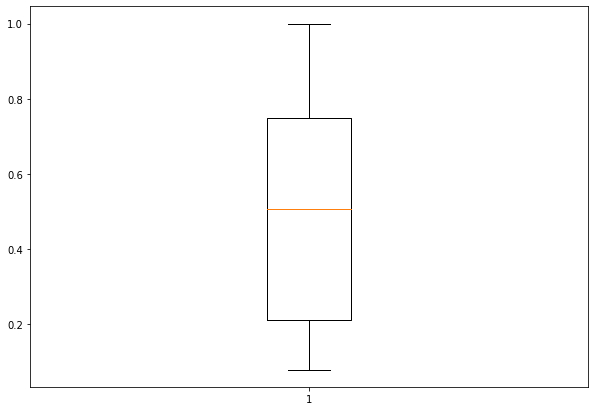

In [264]:
fig = plt.figure(figsize =(10, 7))
plt.boxplot(Y_quiz)
plt.show()

In [265]:
X_train, X_test, y_train, y_test = train_test_split(X_quiz, Y_quiz, test_size=0.8, random_state=50)

**Testeamos primer modelo básico**

In [266]:
lin_reg = SGDRegressor(max_iter=1000, tol=1e-5, penalty=None, eta0=0.1, n_iter_no_change=100, random_state = 50)
lin_reg.fit(X_train, y_train)
lin_reg.intercept_, lin_reg.coef_
y_train_pred = lin_reg.predict(X_train)
y_test_pred = lin_reg.predict(X_test)

In [267]:
mean_squared_error(y_train, y_train_pred), mean_squared_error(y_test, y_test_pred)

(0.0788600315477788, 0.07915171487318329)

**El modelo tiene un error aprox del 7.8%**

# **Creamos el polinomio de grado 2 y grado 3**

In [272]:
poly_features_2 = PolynomialFeatures(degree = 2, include_bias = False)
poly_features_3 = PolynomialFeatures(degree = 3, include_bias = False)
X_poly_train_2 = poly_features_2.fit_transform(X_train)
X_poly_test_2 = poly_features_2.fit_transform(X_test)
X_poly_train_3 = poly_features_3.fit_transform(X_train)
X_poly_test_3 = poly_features_3.fit_transform(X_test)

## **Corremos modelo de polinomio en grado 2**

In [273]:
lin_reg_poly_2 = SGDRegressor(max_iter=5000, tol=1e-5, penalty=None, eta0=0.001, n_iter_no_change=100, random_state = 42)
lin_reg_poly_2.fit(X_poly_train_2, y_train.ravel())
y_train_pred_poly_2 = lin_reg_poly_2.predict(X_poly_train_2)
y_test_pred_poly_2 = lin_reg_poly_2.predict(X_poly_test_2)
mean_squared_error(y_train, y_train_pred_poly_2) , mean_squared_error(y_test, y_test_pred_poly_2)

(0.07359631609754165, 0.0748271112513904)

**El modelo reduce el error a 7.35% en train y 7.48% en test**

# **Corremos modelo de polinomio en grado 3**

In [274]:
lin_reg_poly_3 = SGDRegressor(max_iter=1000, tol=1e-5, penalty=None, eta0= 0.001, n_iter_no_change=100, random_state = 42)
lin_reg_poly_3.fit(X_poly_train_3, y_train.ravel())
y_train_pred_poly_3 = lin_reg_poly_3.predict(X_poly_train_3)
y_test_pred_poly_3 = lin_reg_poly_3.predict(X_poly_test_3)
mean_squared_error(y_train, y_train_pred_poly_3) , mean_squared_error(y_test, y_test_pred_poly_3)

(2.448968560117352e+21, 2.0226622675410774e+21)

**El modelo no se ejecuta de buena forma**

# **Testeo de regularización, alpha y eta**

In [275]:
penalties = ['l1', 'l2', 'elasticnet']
alphas = [0.0001, 0.001, 0.01, 0.05]
etas = [0.0001, 0.001, 0.01, 0.05]

rows = []
for x in penalties:
  for y in alphas:
    for z in etas:
      modelo = SGDRegressor(max_iter=5000, tol=1e-5, penalty=x, alpha=y, eta0=z, n_iter_no_change=100, random_state = 42)
      modelo.fit(X_poly_train_2, y_train.ravel())
      pred_modelo_train = modelo.predict(X_poly_train_2)
      pred_modelo_test = modelo.predict(X_poly_test_2)
      error_1 = mean_squared_error(y_train, pred_modelo_train) 
      error_2 = mean_squared_error(y_test, pred_modelo_test)
      rows.append([x, y, z, error_1, error_2])

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1507: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1507: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1507: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1507: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/linea

**Se guardan todos los modelos**

In [379]:
modelos = pd.DataFrame(rows, columns=["Penalizacion", "Alpha", "Eta", 'RMSE_train', 'RMSE_test']).sort_values(by='RMSE_test', ascending=True)
modelos

,Penalizacion,Alpha,Eta,RMSE_train,RMSE_test
5,l1,0.0010,0.0010,7.386899e-02,7.465663e-02
29,l2,0.0500,0.0010,7.374274e-02,7.468051e-02
37,elasticnet,0.0010,0.0010,7.360448e-02,7.470207e-02
41,elasticnet,0.0100,0.0010,7.401383e-02,7.471181e-02
1,l1,0.0001,0.0010,7.358309e-02,7.473613e-02
25,l2,0.0100,0.0010,7.363252e-02,7.474713e-02
33,elasticnet,0.0001,0.0010,7.355708e-02,7.478897e-02
2,l1,0.0001,0.0100,7.380034e-02,7.481205e-02
21,l2,0.0010,0.0010,7.359766e-02,7.481406e-02
42,elasticnet,0.0100,0.0100,7.416165e-02,7.482078e-02


**El modelo de menor RMSE en test es con penalización l1, alpha y eta = 0.001**

In [280]:
modelofinal = SGDRegressor(max_iter=5000, tol=1e-5, penalty='l1', alpha=0.001, eta0=0.001, n_iter_no_change=100, random_state = 42)
modelofinal.fit(X_poly_train_2, y_train.ravel())

SGDRegressor(alpha=0.001, eta0=0.001, max_iter=5000, n_iter_no_change=100,
             penalty='l1', random_state=42, tol=1e-05)

In [283]:
variables = poly_features_2.get_feature_names_out(X_train.columns)
importancia = modelofinal.coef_

In [284]:
dicci = {'variable':variables,'importancia':importancia}
data_frame_importance = pd.DataFrame(dicci)
data_frame_importance['abs_importance'] = data_frame_importance.importancia.abs()
data_frame_importance = data_frame_importance.sort_values(by='abs_importance', ascending=False)
data_frame_importance.head(10)

,variable,importancia,abs_importance
104,availability 365^2,-0.075684,0.075684
6,availability 365,0.066941,0.066941
5,minimum nights,-0.055607,0.055607
14,room_type__Entire home/apt,0.036712,0.036712
164,room_type__Entire home/apt^2,0.036712,0.036712
139,neighbourhood_g_Brooklyn room_type__Entire hom...,0.030446,0.030446
15,room_type__Private room,0.026750,0.026750
167,room_type__Private room^2,0.026750,0.026750
108,availability 365 neighbourhood_g_Manhattan,-0.020899,0.020899
31,lat room_type__Entire home/apt,-0.020361,0.020361


**Se traen las 10 variables más importantes del modelo.**

**Las variables que más afectan el modelo son la disponibilidad en el último año, el mínimo número de noches (ambas de forma negativa)**

**También, afecta de forma positiva, que el inmueble sea un apartamento o cosa entera / cuarto privado, ubicada en Brooklyn**

# **Se trae la data nueva y se ejecuta el mismo proceso de limpieza y transformación del modelo pasado**

**Lectura, remover nas y transformar a numérico**

In [314]:
data_new = pd.read_csv("https://raw.githubusercontent.com/lmencisoe/CDA/main/Parcial1/losalpes_new.csv")
data_new = data_new.drop_duplicates()
data_new['price'] = data_new['price'].replace('[\$,]', '', regex=True).astype(float)
data_new['service fee'] = data_new['service fee'].replace('[\$,]', '', regex=True).astype(float)
data_new = data_new.drop(columns=['country', 'neighbourhood'])
data_new['nas'] = data_new.isnull().sum(axis=1)
data_new["nas"].value_counts()

0     508
1       4
11      1
Name: nas, dtype: int64

In [315]:
data_new = data_new[data_new['nas'] < 1]
data_price = data_new.copy()
price_orig = data_price['price'].reset_index(drop=True)

**Medianas y reemplazo de outliers**

In [316]:
median_price = statistics.median(data_new['price'])
out_sup_price = data_new['price'].mean(skipna=True) + 3*data_new['price'].std(skipna=True)
median_service_fee = statistics.median(data_new['service fee'])
out_sup_service_fee = data_new['service fee'].mean(skipna=True) + 3*data_new['service fee'].std(skipna=True)
median_minimum_n = statistics.median(data_new['minimum nights'])
out_sup_minimum_n = data_new['minimum nights'].mean(skipna=True) + 3*data_new['minimum nights'].std(skipna=True)
median_ava365 = statistics.median(data_new['availability 365'])
out_sup_ava365= data_new['availability 365'].mean(skipna=True) + 3*data_new['availability 365'].std(skipna=True)
median_lan = statistics.median(data_new['lat'])
median_long = statistics.median(data_new['long'])

In [317]:
data_new['price'][pd.isna(data_new['price'])] = median_price
data_new['service fee'][pd.isna(data_new['service fee'])] = median_service_fee
data_new['minimum nights'][pd.isna(data_new['minimum nights'])] = median_minimum_n
data_new['availability 365'][pd.isna(data_new['availability 365'])] = median_ava365
data_new['lat'][pd.isna(data_new['lat'])] = median_lan
data_new['long'][pd.isna(data_new['long'])] = median_long

In [318]:
data_new['price'][data_new['price'] > out_sup_price] = median_price
data_new['price'][data_new['price'] <= 0] = median_price
data_new['service fee'][data_new['service fee'] > out_sup_service_fee] = median_service_fee
data_new['service fee'][data_new['service fee'] <= 0] = median_service_fee
data_new['minimum nights'][data_new['minimum nights'] > out_sup_minimum_n] = median_minimum_n
data_new['minimum nights'][data_new['minimum nights'] <= 0] = median_minimum_n
data_new['availability 365'][data_new['availability 365'] > 365] = 365
data_new['availability 365'][data_new['availability 365'] <= 0] = median_ava365
data_new

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid 

,id,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,construction year,price,service fee,minimum nights,availability 365,nas
1,55448727,Manhattan,40.71317,-74.00654,False,moderate,Entire home/apt,2006.0,987.0,197.0,2.0,42.0,0
2,56858749,Queens,40.76441,-73.88943,True,flexible,Private room,2018.0,999.0,200.0,2.0,88.5,0
3,39029953,Manhattan,40.73442,-73.98383,True,strict,Private room,2011.0,497.0,99.0,4.0,88.5,0
4,5567200,Manhattan,40.79660,-73.97154,True,strict,Entire home/apt,2022.0,820.0,164.0,4.0,365.0,0
5,18931756,Manhattan,40.74222,-73.99444,False,flexible,Entire home/apt,2012.0,111.0,221.0,29.0,220.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
508,14305691,Brooklyn,40.69232,-73.93446,False,moderate,Private room,2014.0,103.0,21.0,2.0,88.5,0
509,21955046,Brooklyn,40.69122,-73.93753,True,moderate,Private room,2008.0,110.0,22.0,2.0,21.0,0
510,35125192,Brooklyn,40.71896,-73.94270,False,strict,Entire home/apt,2022.0,251.0,50.0,30.0,335.0,0
511,46665500,Brooklyn,40.68531,-73.97451,True,strict,Private room,2022.0,101.0,201.0,1.0,41.0,0


**Crear antiguedad, escalar variables y percentiles para el precio**

In [319]:
data_new['antiguedad'] = 2022 - data_new['construction year']
data_new2 = data_new.copy()
data_new2 = data_new2.drop(columns=['nas', 'construction year'])
data_new2[['service fee', 'lat','long', 'antiguedad','minimum nights','availability 365']] = StandardScaler().fit_transform(data_new2[['service fee', 'lat','long', 'antiguedad','minimum nights','availability 365']] )
data_new2["instant_bookable"] = data_new2["instant_bookable"].astype(int)
data_new2['price'] = pd.qcut(data_new2['price'],q=49 , labels=range(1, 49+1)).astype(int)/100
data_new2

,id,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,antiguedad
1,55448727,Manhattan,-0.314644,-1.173498,0,moderate,Entire home/apt,0.49,1.010804,-0.470449,-0.966745,1.155865
2,56858749,Queens,0.621787,1.236029,1,flexible,Private room,0.49,1.055157,-0.470449,-0.568797,-0.928179
3,39029953,Manhattan,0.073708,-0.706242,1,strict,Private room,0.29,-0.438058,-0.265573,-0.568797,0.287513
4,5567200,Manhattan,1.210073,-0.453376,1,strict,Entire home/apt,0.42,0.522922,-0.265573,1.797496,-1.622861
5,18931756,Manhattan,0.216256,-0.924541,0,flexible,Entire home/apt,0.08,1.365627,2.295379,0.556583,0.113843
...,...,...,...,...,...,...,...,...,...,...,...,...
508,14305691,Brooklyn,-0.695686,0.309542,0,moderate,Private room,0.04,-1.591233,-0.470449,-0.568797,-0.233498
509,21955046,Brooklyn,-0.715789,0.246377,1,moderate,Private room,0.08,-1.576449,-0.470449,-1.146463,0.808525
510,35125192,Brooklyn,-0.208830,0.140004,0,strict,Entire home/apt,0.19,-1.162489,2.397817,1.540755,-1.622861
511,46665500,Brooklyn,-0.823797,-0.514483,1,strict,Private room,0.03,1.069941,-0.572887,-0.975303,-1.622861


**One hot encoding**

In [320]:
data_new3 = data_new2.copy()
neighbourhood_dummies = pd.get_dummies(data_new3['neighbourhood group'], prefix='neighbourhood_g').reset_index(drop=True)
cancellation_policy_dummies = pd.get_dummies(data_new3['cancellation_policy'], prefix='cancellation_policy_').reset_index(drop=True)
room_dummies = pd.get_dummies(data_new3['room type'], prefix='room_type_').reset_index(drop=True)

In [336]:
data_modelo_new = data_new3.copy()
data_modelo_new = pd.concat([data_modelo_new.reset_index(drop=True), neighbourhood_dummies], axis=1)
data_modelo_new = pd.concat([data_modelo_new.reset_index(drop=True), cancellation_policy_dummies], axis=1)
data_modelo_new = pd.concat([data_modelo_new.reset_index(drop=True), room_dummies], axis=1)
data_modelo_new = pd.DataFrame(data_modelo_new)
data_modelo_new.head()

,id,neighbourhood group,lat,long,instant_bookable,cancellation_policy,room type,price,service fee,minimum nights,availability 365,antiguedad,neighbourhood_g_Bronx,neighbourhood_g_Brooklyn,neighbourhood_g_Manhattan,neighbourhood_g_Queens,neighbourhood_g_Staten Island,cancellation_policy__flexible,cancellation_policy__moderate,cancellation_policy__strict,room_type__Entire home/apt,room_type__Hotel room,room_type__Private room,room_type__Shared room
0,55448727,Manhattan,-0.314644,-1.173498,0,moderate,Entire home/apt,0.49,1.010804,-0.470449,-0.966745,1.155865,0,0,1,0,0,0,1,0,1,0,0,0
1,56858749,Queens,0.621787,1.236029,1,flexible,Private room,0.49,1.055157,-0.470449,-0.568797,-0.928179,0,0,0,1,0,1,0,0,0,0,1,0
2,39029953,Manhattan,0.073708,-0.706242,1,strict,Private room,0.29,-0.438058,-0.265573,-0.568797,0.287513,0,0,1,0,0,0,0,1,0,0,1,0
3,5567200,Manhattan,1.210073,-0.453376,1,strict,Entire home/apt,0.42,0.522922,-0.265573,1.797496,-1.622861,0,0,1,0,0,0,0,1,1,0,0,0
4,18931756,Manhattan,0.216256,-0.924541,0,flexible,Entire home/apt,0.08,1.365627,2.295379,0.556583,0.113843,0,0,1,0,0,1,0,0,1,0,0,0


In [337]:
data_modelo_new = data_modelo_new.drop(columns=['neighbourhood group', 'cancellation_policy', 'room type', 'neighbourhood_g_Staten Island','room_type__Hotel room','cancellation_policy__strict'])

In [338]:
data_id = data_modelo_new.copy()
ids_orig = data_id['id']

In [339]:
data_modelo_new = data_modelo_new.drop(columns=['id'])

**Traer la X para predecir con el modelo anterior**

In [326]:
X_quiz_new = data_modelo_new
y_new_pred = lin_reg2.predict(X_quiz_new)

In [358]:
data_new_model_resp = data_modelo_new.copy()
data_new_model_resp['pred'] = y_new_pred
data_new_model_resp['id'] = data_id['id']
data_new_model_resp['price_orig'] = price_orig
data_new_model_resp = data_new_model_resp[['id', 'price','price_orig','pred']]
data_new_model_resp = data_new_model_resp.sort_values(by='pred', ascending=True)
data_new_model_resp.head()

,id,price,price_orig,pred
122,34379587,0.46,925.0,0.320426
324,38583142,0.29,495.0,0.340999
502,51810175,0.35,630.0,0.347270
326,32849163,0.17,197.0,0.348036
160,41522482,0.42,821.0,0.358002


# **K means para encontrar el grupo de menor predicción de reviews**

**TERCER PUNTO**

**Para este punto creamos grupos usando kmeans donde usamos para el eje X y Y la misma variable de predicción (para que el kmeans funcione y separe grupo de predicciones.)**

In [360]:
kmeans_kwargs = {
       "init": "random",
       "n_init": 10,
       "max_iter": 300,
       "random_state": 42,
    }
   
    # A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(data_new_model_resp[["pred", "price"]])
    sse.append(kmeans.inertia_)

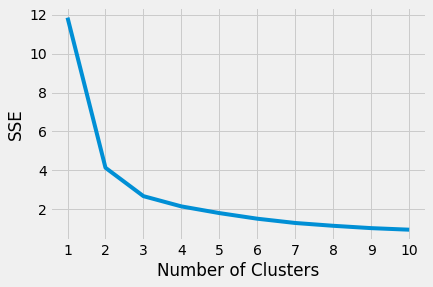

In [361]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

**Con el método del codo vemos que 4 cluster son ideales**

In [373]:
kmeans = KMeans(
        init="random",
        n_clusters=4,
        n_init=10,
        max_iter=300,
        random_state=42)
kmeans.fit(data_new_model_resp[["pred", "pred"]])

KMeans(init='random', n_clusters=4, random_state=42)

In [376]:
data_new_model_resp["cluster"] = kmeans.labels_
data_new_model_resp.groupby(['cluster']).agg({'pred':'mean'})

,pred
cluster,
0,0.585243
1,0.462973
2,0.516668
3,0.397298


In [377]:
data_new_model_resp.groupby(['cluster']).agg({'pred':'count'})

,pred
cluster,
0,50
1,192
2,186
3,80


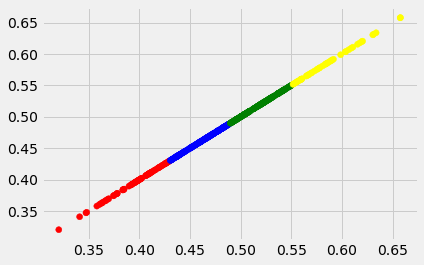

In [378]:
fig, ax = plt.subplots()

colors = {3:'red', 2:'green', 1:'blue', 0:'yellow'}

ax.scatter(data_new_model_resp['pred'], data_new_model_resp['pred'], c=data_new_model_resp['cluster'].map(colors))

plt.show()

**VEmos que el cluster 3 (rojo) son el conjunto de inmuebles con menor score (promedio 0.39), en un total de 80 inmuebles** (Estos son los seleccionados)

In [367]:
data_new_model_resp_c = data_new_model_resp.copy()
data_new_model_resp_c = data_new_model_resp_c[data_new_model_resp_c['cluster'] == 3]
data_new_model_resp_c

,id,price,price_orig,pred,cluster
122,34379587,0.46,925.0,0.320426,3
324,38583142,0.29,495.0,0.340999,3
502,51810175,0.35,630.0,0.347270,3
326,32849163,0.17,197.0,0.348036,3
160,41522482,0.42,821.0,0.358002,3
...,...,...,...,...,...
126,48897897,0.39,720.0,0.426634,3
402,31419259,0.01,60.0,0.427323,3
386,56383771,0.36,651.0,0.428928,3
192,37110710,0.47,958.0,0.429195,3


**Extraemos los inmuebles del cluster de menor score**

In [380]:
gasto_total = data_new_model_resp_c['price_orig'].sum()*0.02
gasto_total

828.5

**El gasto recomendado a la inmobiliaria los Alpes, para el nuevo conjunto de inmuebles es de $828.5 para un total los 80 de menor predicción de reviews.**